In [2]:
import pandas as pd
from collections import Counter
import re

df = pd.read_parquet('data/train-00000-of-00001.parquet')
df.head()

,answers,passages,query,query_id,query_type,wellFormedAnswers
0,[Results-Based Accountability is a disciplined...,"{'is_selected': [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]...",what is rba,19699,description,[]
1,[Yes],"{'is_selected': [0, 1, 0, 0, 0, 0, 0], 'passag...",was ronald reagan a democrat,19700,description,[]
2,[20-25 minutes],"{'is_selected': [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]...",how long do you need for sydney and surroundin...,19701,numeric,[]
3,[$11 to $22 per square foot],"{'is_selected': [0, 0, 0, 0, 0, 0, 0, 0, 1], '...",price to install tile in shower,19702,numeric,[]
4,[Due to symptoms in the body],"{'is_selected': [0, 0, 1, 0, 0, 0, 0, 0], 'pas...",why conversion observed in body,19703,description,[]


In [3]:
#Turn dataset into query, query_id, answer, is_selected
unpacked_data = []

# Iterate through each row in the original dataframe
for index, row in df.iterrows():
    query = row['query']
    query_id = row['query_id']
    
    # Iterate through the passages for each row
    for passage, is_selected in zip(row['passages']['passage_text'], 
                                  row['passages']['is_selected']):
        unpacked_data.append({
            'query': query,
            'query_id': query_id,
            'answer': passage,
            'is_selected': is_selected
        })

new_df = pd.DataFrame(unpacked_data)

# new_df.to_parquet('qa_formatted.parquet')

# new_df.head()

In [5]:
selected_only = new_df[new_df['is_selected'] == True]
print(len(selected_only))
selected_only.to_parquet('selected_only.parquet')

88523


In [27]:
new_df
new_df['answer_word_count'] = new_df['answer'].apply(lambda x: len(str(x).split()))
new_df['query_word_count'] = new_df['query'].apply(lambda x: len(str(x).split()))

In [32]:
print(max(new_df['answer_word_count']))
print(max(new_df['query_word_count']))
new_df.to_parquet('qa_formatted.parquet')

231
26


In [33]:
from gensim.models import KeyedVectors
import torch
import torch.nn as nn
import json

model_path = "data/GoogleNews-vectors-negative300.bin"
word2vec = KeyedVectors.load_word2vec_format(model_path, binary=True)
# Get the vocabulary and embeddings
vocab_size = len(word2vec)
embedding_dim = word2vec.vector_size
weights = torch.tensor(word2vec.vectors, dtype=torch.float32)

# Create a PyTorch Embedding layer
embedding_layer = nn.Embedding.from_pretrained(weights, freeze=False)  # Set freeze=True if you don't want to fine-tune
with open('data/word2index.json', 'r') as f:
    word2index = json.load(f)

def word_to_tensor(word):
    """Convert a word into a tensor index for the embedding layer"""
    if word in word2index:
        return torch.tensor([word2index[word]], dtype=torch.long)
    else:
        return torch.tensor([word2index["unk"]], dtype=torch.long)  # Handle OOV words

def sentence_to_tensor(sentence):
    # print([word_to_tensor(word) for word in sentence.split()])
    return [word_to_tensor(word) for word in sentence.split()]

In [ ]:
max_query_len = 26
max_answer_len = 231

new_df['query_padded'] = new_df['query_tokenized'].apply(
    lambda x: torch.nn.functional.pad(
        torch.cat([t for t in x]), 
        (0, max_query_len - len(x))
    )
)

new_df['answer_padded'] = new_df['answer_tokenized'].apply(
    lambda x: torch.nn.functional.pad(
        torch.cat([t for t in x]), 
        (0, max_answer_len - len(x))
    )
)




In [47]:
new_df.head()

,query,query_id,answer,is_selected,answer_word_count,query_word_count,query_tokenized,answer_tokenized,query_padded
0,what is rba,19699,"Since 2007, the RBA's outstanding reputation h...",0,78,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(1149)], [tensor(1459665)], [tensor(11...","[tensor(83), tensor(4), tensor(1517150), tenso..."
1,what is rba,19699,The Reserve Bank of Australia (RBA) came into ...,0,83,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(7)], [tensor(7861)], [tensor(669)], [...","[tensor(83), tensor(4), tensor(1517150), tenso..."
2,what is rba,19699,RBA Recognized with the 2014 Microsoft US Regi...,0,30,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(18780)], [tensor(29967)], [tensor(8)]...","[tensor(83), tensor(4), tensor(1517150), tenso..."
3,what is rba,19699,The inner workings of a rebuildable atomizer a...,0,107,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(7)], [tensor(7999)], [tensor(27247)],...","[tensor(83), tensor(4), tensor(1517150), tenso..."
4,what is rba,19699,Results-Based Accountability® (also known as R...,0,95,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(1459665)], [tensor(1459665)], [tensor...","[tensor(83), tensor(4), tensor(1517150), tenso..."


In [46]:
print(new_df['query_padded'][0])

tensor([     83,       4, 1517150,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0])


In [41]:
# new_df['query_tokenized'] = new_df['query'].apply(lambda x: [word_to_tensor(word) for word in x.split()])
# new_df['answer_tokenized'] = new_df['answer'].apply(lambda x: [word_to_tensor(word) for word in x.split()])
new_df.head()

# new_df.to_parquet('qa_formatted.parquet')

,query,query_id,answer,is_selected,answer_word_count,query_word_count,query_tokenized,answer_tokenized
0,what is rba,19699,"Since 2007, the RBA's outstanding reputation h...",0,78,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(1149)], [tensor(1459665)], [tensor(11..."
1,what is rba,19699,The Reserve Bank of Australia (RBA) came into ...,0,83,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(7)], [tensor(7861)], [tensor(669)], [..."
2,what is rba,19699,RBA Recognized with the 2014 Microsoft US Regi...,0,30,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(18780)], [tensor(29967)], [tensor(8)]..."
3,what is rba,19699,The inner workings of a rebuildable atomizer a...,0,107,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(7)], [tensor(7999)], [tensor(27247)],..."
4,what is rba,19699,Results-Based Accountability® (also known as R...,0,95,3,"[[tensor(83)], [tensor(4)], [tensor(1517150)]]","[[tensor(1459665)], [tensor(1459665)], [tensor..."


In [42]:
print(type(new_df['query_tokenized'].iloc[0]))

<class 'list'>


In [22]:
# Sample 10 random queries and their associated answers
sampled_queries = new_df.groupby('query_id').agg({
    'query': 'first',
    'answer': 'first',
    # 'is_selected': list
}).sample(n=30, random_state=42)

sampled_queries.head()

# # Create a list of dictionaries containing the samples
samples = []
for idx, row in sampled_queries.iterrows():
    sample = {
        'query': row['query'],
        'answers': row['answer']
    }
    samples.append(sample)

print(samples)

[{'query': 'where is burnwell ala', 'answers': 'Indiana, USA. Bobby Ray Goodman, 62, of Madisonville, Ky., died Sunday, May 7, 2000, at Select Speciality Hospital in Evansville, Indiana. Funeral services will be at 1 p.m., Wednesday, May 10, 2000, at Burnwell Bible Church of God with burial in the adjoining cemetery with military honors by Walker County Honor Guard. Joel Hemphill, John Minnick, Gene Smith will officiate. Kilgore-Green Funeral Home will direct. He was a member of the Happy Goodman Family Gospel singers, a member of the Gospel Music Association, a member of Pentecostal Faith and a veteran of the U.S. Army serving two years in Germany. He was preceded in death by his parents, Sam and Gussie Goodman, three brothers and four sisters.'}, {'query': 'what constitutes connective tissue', 'answers': 'Adipose tissue is a form of loose connective tissue that stores fat. Adipose lines organs and body cavities to protect organs and insulate the body against heat loss. Even though it

In [11]:
df = pd.read_parquet('data/validation-00000-of-00001.parquet')
#Turn dataset into query, query_id, answer, is_selected
unpacked_data = []

# Iterate through each row in the original dataframe
for index, row in df.iterrows():
    query = row['query']
    query_id = row['query_id']
    
    # Iterate through the passages for each row
    for passage, is_selected in zip(row['passages']['passage_text'], 
                                  row['passages']['is_selected']):
        unpacked_data.append({
            'query': query,
            'query_id': query_id,
            'answer': passage,
            'is_selected': is_selected
        })

new_df = pd.DataFrame(unpacked_data)

new_df.to_parquet('qa_formatted_validation.parquet')

# new_df.head()

In [3]:
# Find the frequency of words in this dataset
grouped_answers = new_df.groupby('query_id').agg({
    'query': 'first',  # Keep the first query text
    'answer': ' '.join,  # Concatenate all answers
}).reset_index()

# Function to process text and get word frequencies
def get_word_frequencies(text):
    # Convert to lowercase and split into words
    # Remove punctuation and numbers
    words = re.findall(r'\b[a-zA-Z]+\b', text.lower())
    return Counter(words)
all_text = ' '.join(new_df['answer']) + ' ' + ' '.join(new_df['query'])

In [4]:

def get_word_frequencies(text):
    # Convert to lowercase and split into words
    # Remove punctuation and numbers
    words = re.findall(r'\b[a-zA-Z]+\b', text.lower())
    return Counter(words)

all_text = ' '.join(new_df['answer']) + ' ' + ' '.join(new_df['query'])
all_words = get_word_frequencies(all_text)  # Define all_words here

# Use punkt tokenizer
import nltk
nltk.download('punkt')  # Download punkt tokenizer data
sentences = nltk.sent_tokenize(all_text)

print(f"Number of sentences: {len(sentences)}")
print("\nFirst few sentences:")
print(sentences[:100])

[nltk_data] Error loading punkt: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1000)>


Number of sentences: 2896651

First few sentences:
["Since 2007, the RBA's outstanding reputation has been affected by the 'Securency' or NPA scandal.", 'These RBA subsidiaries were involved in bribing overseas officials so that Australia might win lucrative note-printing contracts.', 'The assets of the bank include the gold and foreign exchange reserves of Australia, which is estimated to have a net worth of A$101 billion.', "Nearly 94% of the RBA's employees work at its headquarters in Sydney, New South Wales and at the Business Resumption Site.", "The Reserve Bank of Australia (RBA) came into being on 14 January 1960 as Australia 's central bank and banknote issuing authority, when the Reserve Bank Act 1959 removed the central banking functions from the Commonwealth Bank.", 'The assets of the bank include the gold and foreign exchange reserves of Australia, which is estimated to have a net worth of A$101 billion.', "Nearly 94% of the RBA's employees work at its headquarters in Sydne

In [5]:
# ... existing code ...
import json
def get_word_frequencies(text):
    # Convert to lowercase and split into words
    # Remove punctuation and numbers
    words = re.findall(r'\b[a-zA-Z]+\b', text.lower())
    return Counter(words)

all_text = ' '.join(new_df['answer']) + ' ' + ' '.join(new_df['query'])
all_words = get_word_frequencies(all_text)

# Load word2index.json
with open('data/word2index.json', 'r') as f:
    word2index = json.load(f)

# Get total word count and matched word count
total_words = sum(all_words.values())
matched_words = sum(all_words[word] for word in all_words if word in word2index)

# Calculate percentage
coverage_percentage = (matched_words / total_words) * 100

print(f"Total words in dataset: {total_words}")
print(f"Words found in word2index: {matched_words}")
print(f"Coverage percentage: {coverage_percentage:.2f}%")

Total words in dataset: 50944837
Words found in word2index: 44286476
Coverage percentage: 86.93%


In [1]:
# Load word2index.json
import json

with open('data/word2index.json', 'r') as f:
    word2index = json.load(f)

# Convert all_words Counter to a set of words
dataset_words = set(all_words.keys())
word2index_words = set(word2index.keys())

# Find words that are in our dataset but not in word2index
unique_words = dataset_words - word2index_words

print(f"Number of words in our dataset: {len(dataset_words)}")
print(f"Number of words in word2index: {len(word2index_words)}")
print(f"Number of words unique to our dataset: {len(unique_words)}")

# Display some examples of unique words (optional)
print("\nExample unique words:")
print(list(unique_words)[:20])

NameError: name 'all_words' is not defined

In [51]:
# Read the training examples parquet file
training_df = pd.read_parquet('qa_formatted.parquet')

# Display top 50 rows
print("Top 50 training examples:")
training_df.head(50)

Top 50 training examples:


,query,query_id,answer,is_selected
0,what is rba,19699,"Since 2007, the RBA's outstanding reputation has been affected by the 'Securency' or NPA scandal...",0
1,what is rba,19699,The Reserve Bank of Australia (RBA) came into being on 14 January 1960 as Australia 's central b...,0
2,what is rba,19699,RBA Recognized with the 2014 Microsoft US Regional Partner of the ... by PR Newswire. Contract A...,0
3,what is rba,19699,The inner workings of a rebuildable atomizer are surprisingly simple. The coil inside the RBA is...,0
4,what is rba,19699,Results-Based Accountability® (also known as RBA) is a disciplined way of thinking and taking ac...,0
5,what is rba,19699,Results-Based Accountability® (also known as RBA) is a disciplined way of thinking and taking ac...,1
6,what is rba,19699,"RBA uses a data-driven, decision-making process to help communities and organizations get beyond...",0
7,what is rba,19699,vs. NetIQ Identity Manager. Risk-based authentication (RBA) is a method of applying varying leve...,0
8,what is rba,19699,"A rebuildable atomizer (RBA), often referred to as simply a “rebuildable,” is just a special typ...",0
9,what is rba,19699,"Get To Know Us. RBA is a digital and technology consultancy with roots in strategy, design and t...",0


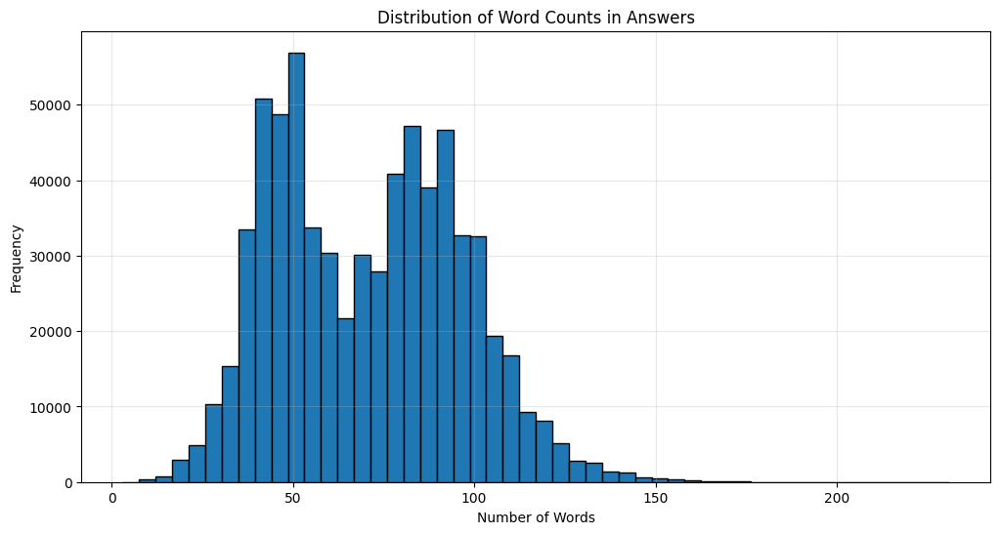


Word Count Statistics:
count    676193.000000
mean         70.887720
std          25.665455
min           3.000000
25%          49.000000
50%          71.000000
75%          91.000000
max         231.000000
Name: word_count, dtype: float64


In [52]:
# Calculate word counts for each answer
new_df['word_count'] = training_df['answer'].apply(lambda x: len(str(x).split()))

# Create a histogram using pandas plotting
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
new_df['word_count'].hist(bins=50, edgecolor='black')
plt.title('Distribution of Word Counts in Answers')
plt.xlabel('Number of Words')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# Print some summary statistics
print("\nWord Count Statistics:")
print(new_df['word_count'].describe())

In [41]:
# Create a set of unique words (those in questions but not in wikipedia)
unique_words_df = pd.DataFrame(unique_words, columns=['word', 'frequency'])

# Sort by frequency in descending order
unique_words_df = unique_words_df.sort_values('frequency', ascending=False)

# Display the results
print("Words unique to our dataset (not in wikipedia):")
print(unique_words_df)

# Optionally save to CSV
unique_words_df.to_csv('unique_words.csv', index=False)

Words unique to our dataset (not in wikipedia):
                                                                                       word  \
151                                                                                facebook   
45                                                                                  preheat   
471                                                                                  iphone   
600                                                                                   carbs   
121                                                                                   sylls   
105                                                                                payscale   
1685                                                                                  strep   
215                                                                                doneness   
1919                                                                             countertop   
92